In [14]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')
cuts=Table.read('gzh_cuts.fits')

p_features_cut=cuts['p_features_cut'][0]
p_clumpy_yes_cut=cuts['p_clumpy_yes_cut'][0]
p_clumpy_no_cut = cuts['p_clumpy_no_cut'][0]

#current threshold values:

p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' 
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction' 
p_clumpy_no = 't12_clumpy_a02_no_weighted_fraction' 

p_odd = 't06_odd_a01_yes_weighted_fraction'
p_irregular = 't08_odd_feature_a04_irregular_weighted_fraction'



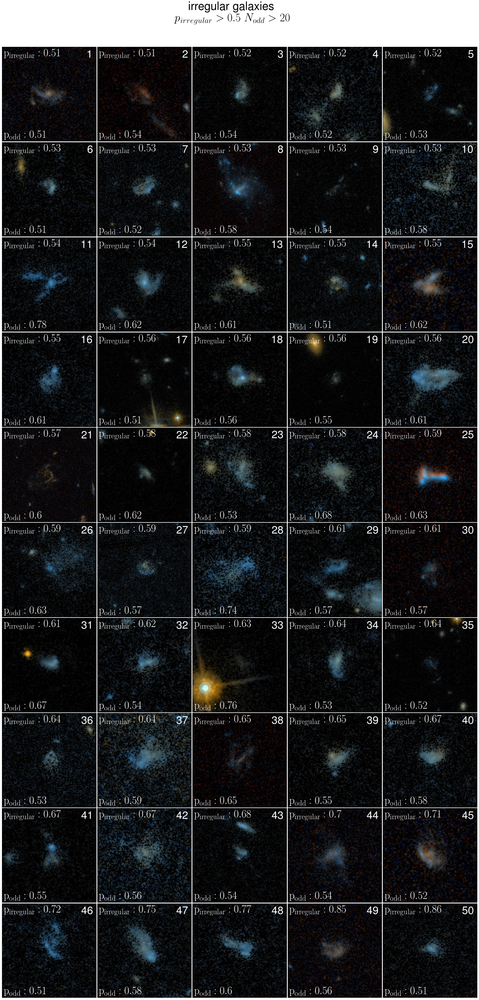

In [7]:
p_odd_cut = .5
p_irregular_cut = 0.5

odd = (data[p_odd]>p_odd_cut)
irregular = (data[p_irregular]>p_irregular_cut)

gs=gridspec.GridSpec(10,5)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= odd & irregular
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.seed(3)
random.shuffle(n_list)

labels = np.linspace(1,50,50)

#how many galaxies to display?
n_gals = 50
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_irregular, column 71
random_gal_list.sort(key=itemgetter(71))

f=plt.figure(figsize=(30,60))
n=0
for i in range (0,10):
    for j in range(0,5):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{irregular}: %s}$'%round(gal[p_irregular],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{odd}: %s}$'%round(gal[p_odd],2),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')
        
        ax.annotate('%s'%int(labels[n]),fontsize=38,xy=(0.97,0.97),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')


        n+=1
        

f.text(.5,.92,'irregular galaxies \n$p_{irregular}>%s$ $N_{odd}>20$'%(p_irregular_cut), fontsize=40,ha='center')





In [8]:
len(these_data)

1548

(array([  21.,   50.,  114.,  188.,  230.,  277.,  297.,  182.,  136.,   53.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 1 Patch objects>)

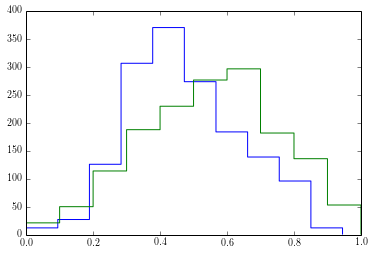

In [11]:
plt.hist(these_data[p_features],histtype='step')
plt.hist(these_data[p_clumpy_yes],histtype='step')

In [16]:
featured_not_clumpy_irregulars = (data[p_features]>p_features_cut) & (data[p_clumpy_no]>p_clumpy_no_cut) & odd & irregular
featured_clumpy_irregulars = (data[p_features]>p_features_cut) & (data[p_clumpy_yes]>p_clumpy_yes_cut) & odd & irregular


In [18]:
len(data[featured_not_clumpy_irregulars])

1105

In [17]:
len(data[featured_clumpy_irregulars])

172